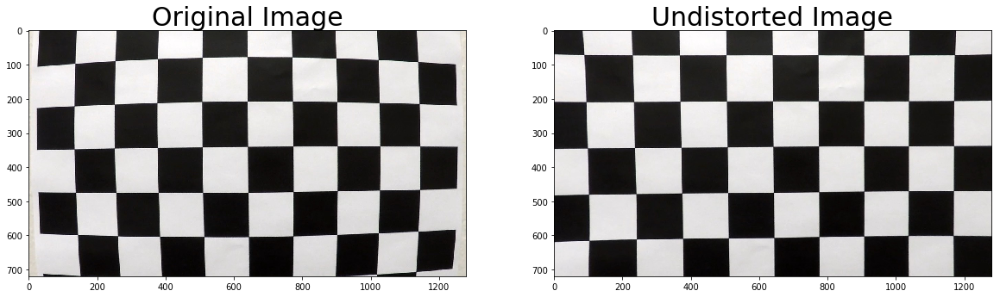

In [1]:
import math
import numpy as np
import pickle
import cv2
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

cal_dump = 'camera_cal/camera_dist_pickle.p'
src_path = 'camera_cal/calibration1.jpg'

dist_pickle= pickle.load(open(cal_dump, "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

## Undistortion
def undistort(img, mtx, dist):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

img = mpimg.imread(src_path)
undist_img = undistort(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_img)
ax2.set_title('Undistorted Image', fontsize=30)

In [2]:
## Notice: Assuming input image is in RGB color space

## Draw region of interest
def draw_region_of_interest(img, vertices=[[578, 460], [705, 460], [1120, 720], [190, 720]]):
    pts = np.array(vertices, np.int32)
    pts = pts.reshape((-1,1,2))
    return cv2.polylines(img,[pts],True,(255,0,0), thickness=2)


## Perspective transform
def perspective_transform(img, vertices=[[578, 460], [705, 460], [1120, 720], [190, 720]], offset=300):        
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32(vertices)
    dst = np.float32([[offset, 0], 
                      [img_size[0]-offset, 0], 
                      [img_size[0]-offset, img_size[1]], 
                      [offset, img_size[1]]])
    
    # Given src and dst points, calcula  te the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, M_inv

In [3]:
## HLS Threshold
def hls_threshold(img, threshold=(170, 255)):
    img = np.copy(img)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= threshold[0]) & (s_channel <= threshold[1])] = 1
    
    return s_binary


## X-Gradient threshold
def sobel_x_gradient_threshold(img, threshod=(20, 100), kernel=9):
    img = np.copy(img)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Take the derivative in x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize=kernel)
    # Absolute x derivative to accentuate lines away from horizontal
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= threshod[0]) & (scaled_sobel <= threshod[1])] = 1
    
    return sxbinary


## R-Channel Threshold
def red_threshold(img, threshold=(200, 255)):
    img = np.copy(img)
    
    # RGB Channel
    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]
    red_binary = np.zeros_like(R)
    red_binary[(R > threshold[0]) & (R <= threshold[1])] = 1
    
    return red_binary


## Gray Scale Threshold
def gray_threshold(img, threshold=(180, 255)):
    img = np.copy(img)
    
    # Gray channel
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray_binary = np.zeros_like(gray)
    gray_binary[(gray > threshold[0]) & (gray <= threshold[1])] = 1
    
    return gray_binary


## White Color Threshold
def white_threshold(img, threshold=([200,200,200], [255,255,255])):
    img = np.copy(img)
    
    # White color in RGB
    white_mask = cv2.inRange(img, np.array(threshold[0], dtype=np.uint8), np.array(threshold[1], dtype=np.uint8))
    white_binary = np.zeros_like(img[:,:,0])
    white_binary[white_mask > 0] = 1
    
    return white_binary


## Yellow Color Threshold
def yellow_threshold(img, threshold=([20,100,100], [30,255,255])):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    
    # Yellow color in HSV
    # Reference: https://stackoverflow.com/questions/9179189/detect-yellow-color-in-opencv
    yellow_mask = cv2.inRange(hsv, np.array(threshold[0], dtype=np.uint8), np.array(threshold[1], dtype=np.uint8))
    yellow_binary = np.zeros_like(img[:,:,0])
    yellow_binary[yellow_mask > 0] = 1
    
    return yellow_binary


## Combined Threshold
def combined_threshold(img):
    hls_binary = hls_threshold(img)
    sxbinary = sobel_x_gradient_threshold(img)
    red_binary = red_threshold(img)
    gray_binary = gray_threshold(img)
    white_binary = white_threshold(img)
    yellow_binary = yellow_threshold(img)
    
    combined_binary = np.zeros_like(hls_binary)
    combined_binary[(hls_binary == 1) & (gray_binary == 1)] = 255
    combined_binary[(hls_binary == 1) & (red_binary == 1)] = 255
    combined_binary[(hls_binary == 1) & (sxbinary == 1)] = 255
    combined_binary[(white_binary == 1) | (yellow_binary == 1)] = 255

    combined_binary = combined_binary.astype('uint8')    
    
    return combined_binary

In [4]:
## Histogram method to find lane line
def histogram_search(binary_warped, nwindows = 6, margin = 110, minpix = 50, overall=False):
    # Take a histogram of the bottom half of the image or all of the image
    if overall:
        histogram = np.sum(binary_warped[:binary_warped.shape[0],:], axis=0)
    else:
        histogram = np.sum(binary_warped[np.int(binary_warped.shape[0]/2):,:], axis=0)    
        
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    return leftx, lefty, rightx, righty, left_fit, right_fit, out_img


## Fast version of histogram method
def histogram_search_fast(binary_warped, left_fit, right_fit, nwindows = 6, margin = 110, minpix = 50):
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return leftx, lefty, rightx, righty, left_fit, right_fit, out_img

## Calculate the measurement of the laneline detection result
def cal_curvature_measure(lefty, leftx, righty, rightx, ploty, ym_per_pix = 30/720, xm_per_pix = 3.7/700):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Center in meter
    center_in_meter= 1280/2 * xm_per_pix
    
    # Calculate the distance of vehicle from the center of the lane
    left_in_meter = left_fit_cr[0]*(y_eval*ym_per_pix)**2 + left_fit_cr[1]*(y_eval*ym_per_pix) + left_fit_cr[2]
    right_in_meter = right_fit_cr[0]*(y_eval*ym_per_pix)**2 + right_fit_cr[1]*(y_eval*ym_per_pix) + right_fit_cr[2]
    lane_center_in_meter = (left_in_meter + right_in_meter) / 2
    vehicle_position = center_in_meter - lane_center_in_meter
    
    return left_curverad, right_curverad, vehicle_position

## Apply the detection result to the original image inversely
def apply_inverse(warped, undist, M_inv, left_fitx, right_fitx, ploty, left_curverad, right_curverad, vehicle_position, frame = 1):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (undist.shape[1], undist.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # Put measurements into result image
    text = "Radius Of Left Curvature=" + str(round(left_curverad, 2)) + "(m)"
    cv2.putText(result, text, (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    text = "Radius Of Right Curvature=" + str(round(right_curverad, 2)) + "(m)"
    cv2.putText(result, text, (20, 120), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    text = "Distance From Center=" + str(round((vehicle_position),2)) + "(m)"
    cv2.putText(result, text, (20, 160), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    text = "Frame No.=" + str(frame)
    cv2.putText(result, text, (20, 200), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    
    return result

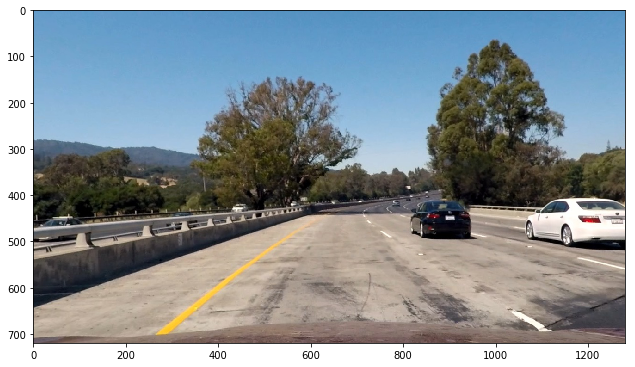

In [5]:
# Undistortion image
titles = []
images = []
types = []
    
file_path = './test_images/test1.jpg'
img = mpimg.imread(file_path)
img = undistort(img, mtx, dist)
images.append(img)
titles.append(file_path)
types.append('rgb')

# Plotting
assert len(titles)==len(images)
assert len(titles)==len(types)
plt.figure(figsize=(20, 20))
for i in range(0, len(images)):
    plt.subplot(4, 2, i + 1)

    if types[i] == 'gray':
        plt.imshow(np.array(images[i]), cmap='gray')
    elif types[i] == 'hist':
        plt.imshow(np.array(images[i]))
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    else:
        plt.imshow(np.array(images[i]))

plt.tight_layout()

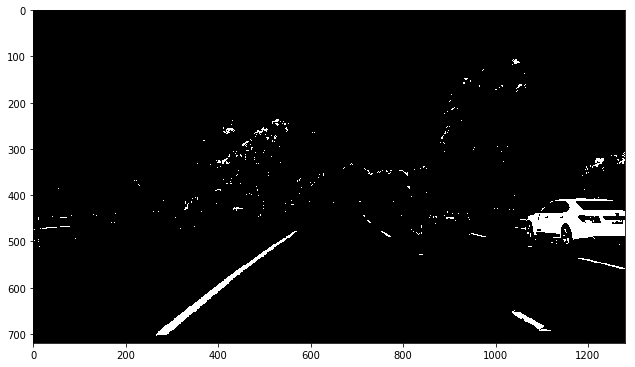

In [6]:
# Binary image
titles = []
images = []
types = []
    
file_path = './test_images/test1.jpg'
img = mpimg.imread(file_path)
img = undistort(img, mtx, dist)
img = combined_threshold(img)
images.append(img)
titles.append('Binary')
types.append('gray')

# Plotting
assert len(titles)==len(images)
assert len(titles)==len(types)
plt.figure(figsize=(20, 20))
for i in range(0, len(images)):
    plt.subplot(4, 2, i + 1)

    if types[i] == 'gray':
        plt.imshow(np.array(images[i]), cmap='gray')
    elif types[i] == 'hist':
        plt.imshow(np.array(images[i]))
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    else:
        plt.imshow(np.array(images[i]))

plt.tight_layout()

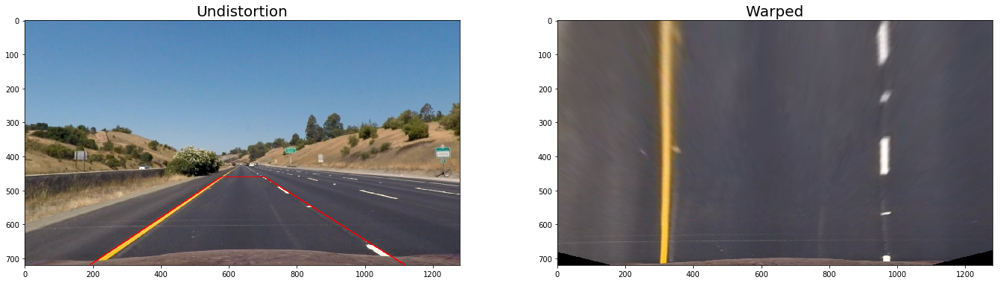

In [7]:
# Warped image
titles = []
images = []
types = []

file_path = './test_images/straight_lines1.jpg'

img = mpimg.imread(file_path)
img = undistort(img, mtx, dist)
img = draw_region_of_interest(img)
images.append(img)
titles.append('Undistortion')
types.append('rgb')
    
img = mpimg.imread(file_path)
img = undistort(img, mtx, dist)
img, _, _ = perspective_transform(img)
images.append(img)
titles.append('Warped')
types.append('rgb')

# Plotting
assert len(titles)==len(images)
assert len(titles)==len(types)
plt.figure(figsize=(20, 20))
for i in range(0, len(images)):
    plt.subplot(4, 2, i + 1)

    plt.title(titles[i], wrap=True, fontsize=20)
    if types[i] == 'gray':
        plt.imshow(np.array(images[i]), cmap='gray')
    elif types[i] == 'hist':
        plt.imshow(np.array(images[i]))
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    else:
        plt.imshow(np.array(images[i]))

plt.tight_layout()

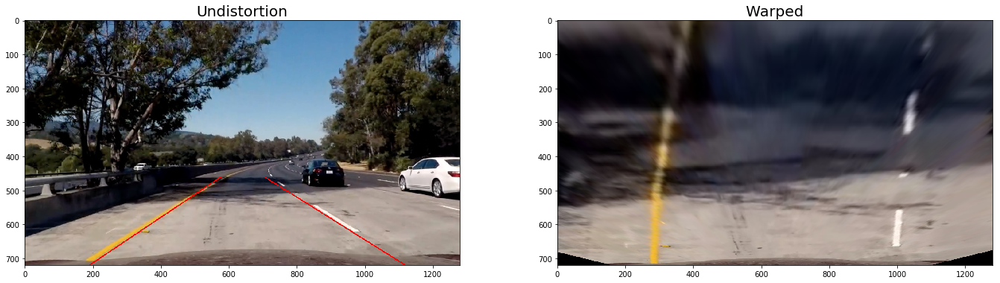

In [8]:
# Warped image
titles = []
images = []
types = []

file_path = './test_images/test5.jpg'

img = mpimg.imread(file_path)
img = undistort(img, mtx, dist)
img = draw_region_of_interest(img)
images.append(img)
titles.append('Undistortion')
types.append('rgb')
    
img = mpimg.imread(file_path)
img = undistort(img, mtx, dist)
img, _, _ = perspective_transform(img)
images.append(img)
titles.append('Warped')
types.append('rgb')

# Plotting
assert len(titles)==len(images)
assert len(titles)==len(types)
plt.figure(figsize=(20, 20))
for i in range(0, len(images)):
    plt.subplot(4, 2, i + 1)

    plt.title(titles[i], wrap=True, fontsize=20)
    if types[i] == 'gray':
        plt.imshow(np.array(images[i]), cmap='gray')
    elif types[i] == 'hist':
        plt.imshow(np.array(images[i]))
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    else:
        plt.imshow(np.array(images[i]))

plt.tight_layout()

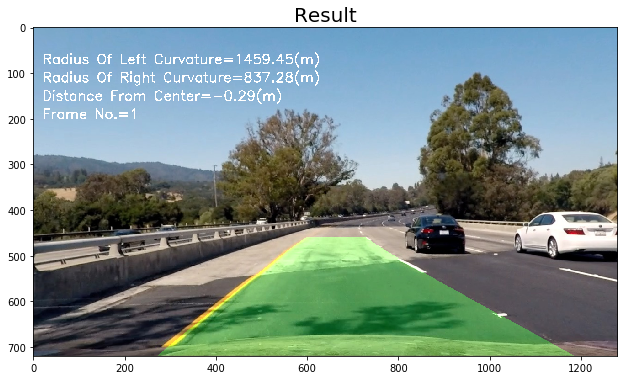

In [9]:
# Result
# Warped image
titles = []
images = []
types = []

file_path = './test_images/test4.jpg'

img = mpimg.imread(file_path)
img = undistort(img, mtx, dist)
undist = np.copy(img)
img = combined_threshold(img)
img, M, M_inv = perspective_transform(img)
binary_warped = np.copy(img)
leftx, lefty, rightx, righty, left_fit, right_fit, out_img = histogram_search(img)
    
ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
left_curverad, right_curverad, vehicle_position = cal_curvature_measure(lefty, leftx, righty, rightx, ploty)
inverse_image = apply_inverse(binary_warped, undist, M_inv, left_fitx, right_fitx, ploty, left_curverad, right_curverad, vehicle_position)
    
images.append(inverse_image)
titles.append('Result')
types.append('rgb')

# Plotting
assert len(titles)==len(images)
assert len(titles)==len(types)
plt.figure(figsize=(20, 20))
for i in range(0, len(images)):
    plt.subplot(4, 1, i + 1)

    plt.title(titles[i], wrap=True, fontsize=20)
    if types[i] == 'gray':
        plt.imshow(np.array(images[i]), cmap='gray')
    elif types[i] == 'hist':
        plt.imshow(np.array(images[i]))
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
    else:
        plt.imshow(np.array(images[i]))

plt.tight_layout()

In [10]:
def test_pipeline(file_path):
    titles = []
    images = []
    types = []

    # Original image
    img = mpimg.imread(file_path)
    img = undistort(img, mtx, dist)
    img = draw_region_of_interest(img)
    images.append(img)
    titles.append(file_path)
    types.append('rgb')
    
    # Binary image
    img = mpimg.imread(file_path)
    img = undistort(img, mtx, dist)
    img = combined_threshold(img)
    images.append(img)
    titles.append('Binary')
    types.append('gray')
    
    # Warped image
    img = mpimg.imread(file_path)
    img = undistort(img, mtx, dist)
    img, _, _ = perspective_transform(img)
    images.append(img)
    titles.append('Warped')
    types.append('rgb')

    # Binary Warped image
    img = mpimg.imread(file_path)
    img = undistort(img, mtx, dist)
    img = combined_threshold(img)
    img, _, _ = perspective_transform(img)
    images.append(img)
    titles.append('Binary Warped')
    types.append('gray')

    # Histogram search image
    img = mpimg.imread(file_path)
    img = undistort(img, mtx, dist)
    img = combined_threshold(img)
    img, M, M_inv = perspective_transform(img)
    leftx, lefty, rightx, righty, left_fit, right_fit, out_img = histogram_search(img)
    images.append(out_img)
    titles.append('Histogram')
    types.append('hist')

    # Result image
    img = mpimg.imread(file_path)
    img = undistort(img, mtx, dist)
    undist = np.copy(img)
    img = combined_threshold(img)
    img, M, M_inv = perspective_transform(img)
    binary_warped = np.copy(img)
    leftx, lefty, rightx, righty, left_fit, right_fit, out_img = histogram_search(img)
    
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_curverad, right_curverad, vehicle_position = cal_curvature_measure(lefty, leftx, righty, rightx, ploty)
    inverse_image = apply_inverse(binary_warped, undist, M_inv, left_fitx, right_fitx, ploty, left_curverad, right_curverad, vehicle_position)
    
    images.append(inverse_image)
    titles.append('Result')
    types.append('rgb')
    
    # Plotting
    assert len(titles)==len(images)
    assert len(titles)==len(types)
    plt.figure(figsize=(20, 20))
    for i in range(0, len(images)):
        plt.subplot(4, 2, i + 1)

        plt.title(titles[i], wrap=True, fontsize=20)
        if types[i] == 'gray':
            plt.imshow(np.array(images[i]), cmap='gray')
        elif types[i] == 'hist':
            plt.imshow(np.array(images[i]))
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')
        else:
            plt.imshow(np.array(images[i]))

    plt.tight_layout()

test image: test_images/straight_lines2.jpg
test image: test_images/test6.jpg
test image: test_images/test1.jpg
test image: test_images/test4.jpg
test image: test_images/test2.jpg
test image: test_images/straight_lines1.jpg
test image: test_images/test5.jpg
test image: test_images/test3.jpg


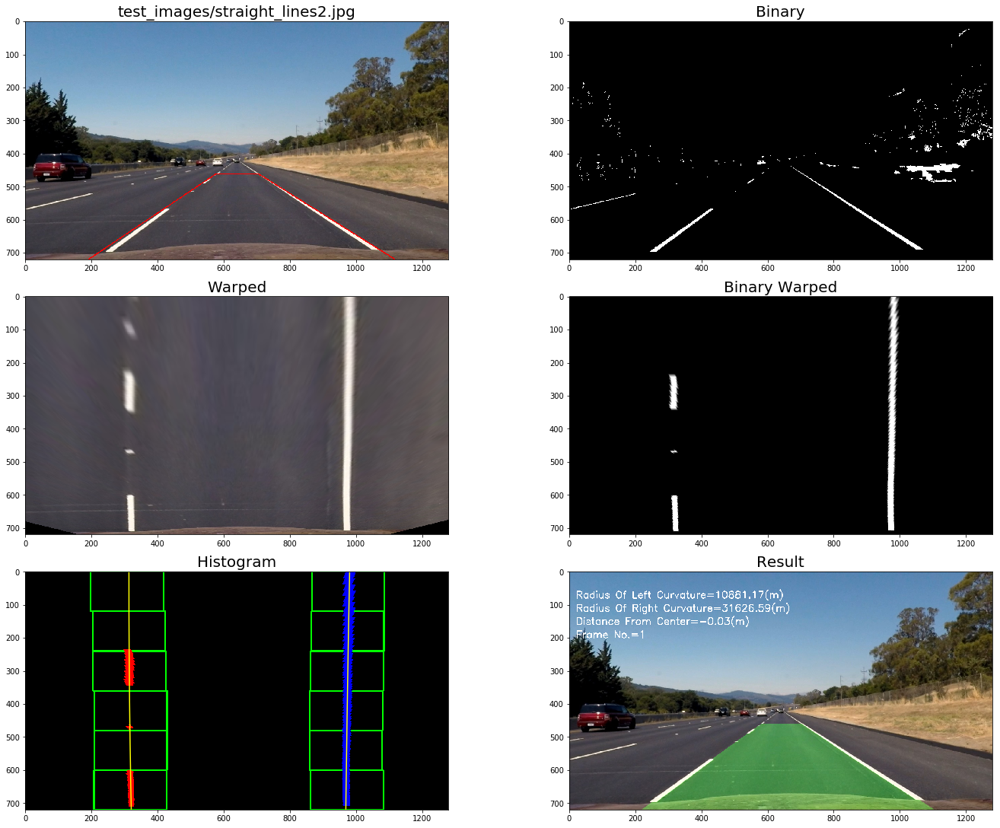

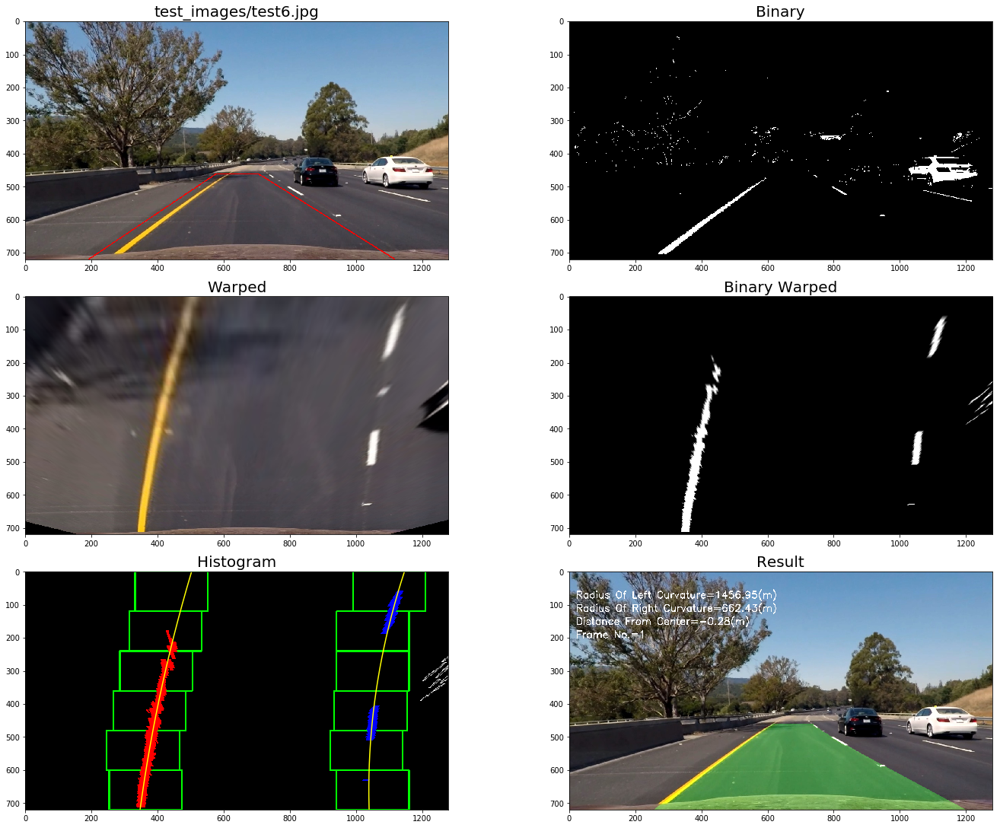

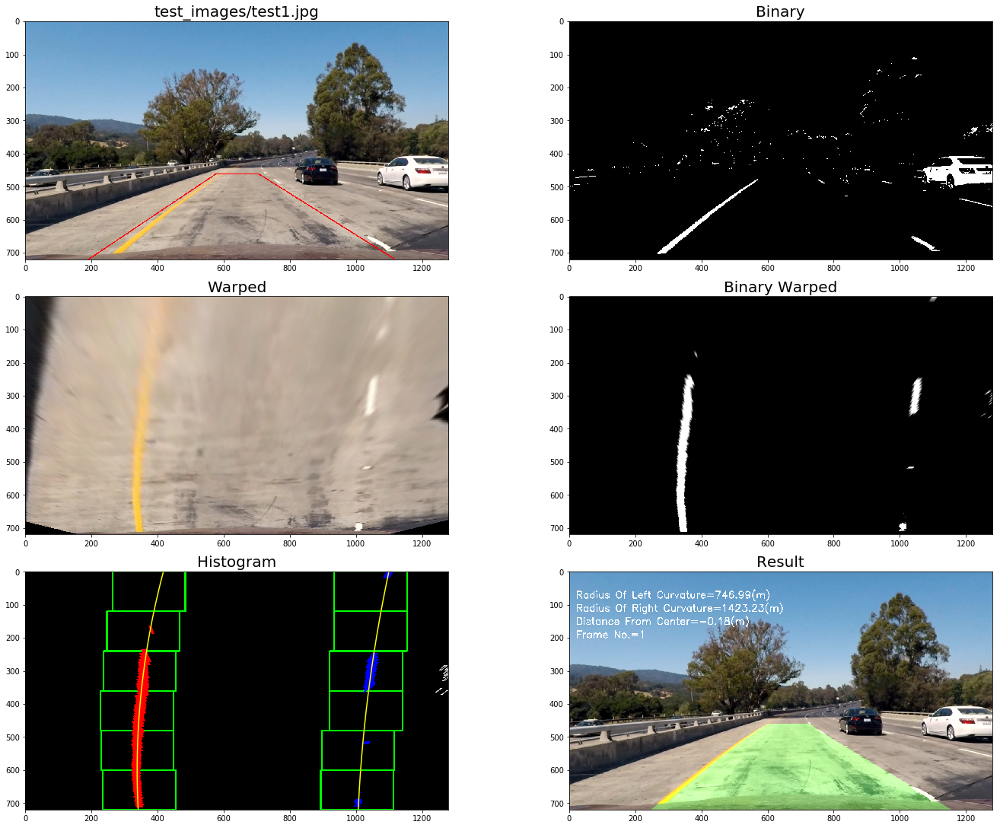

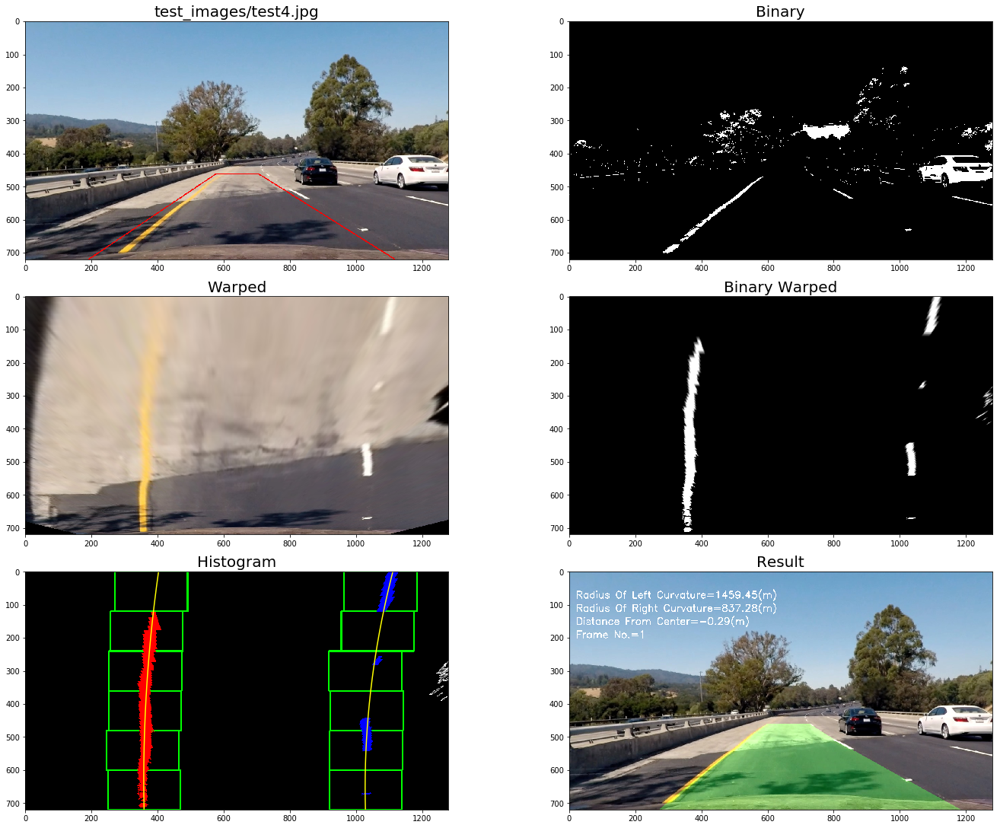

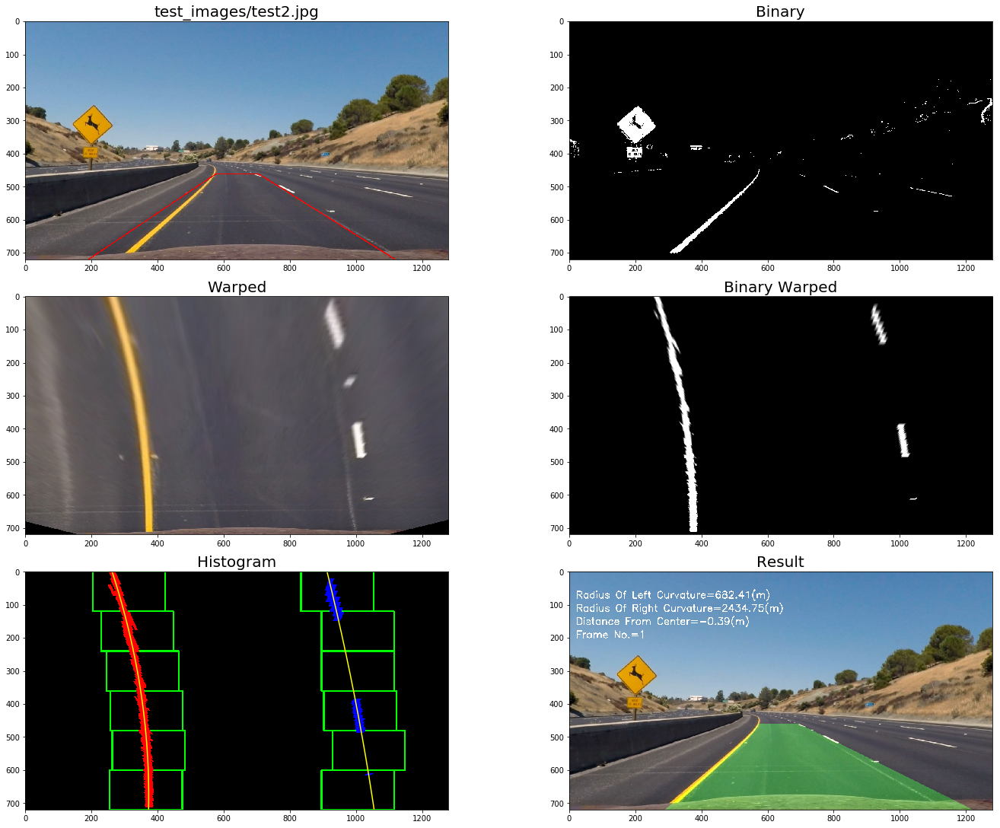

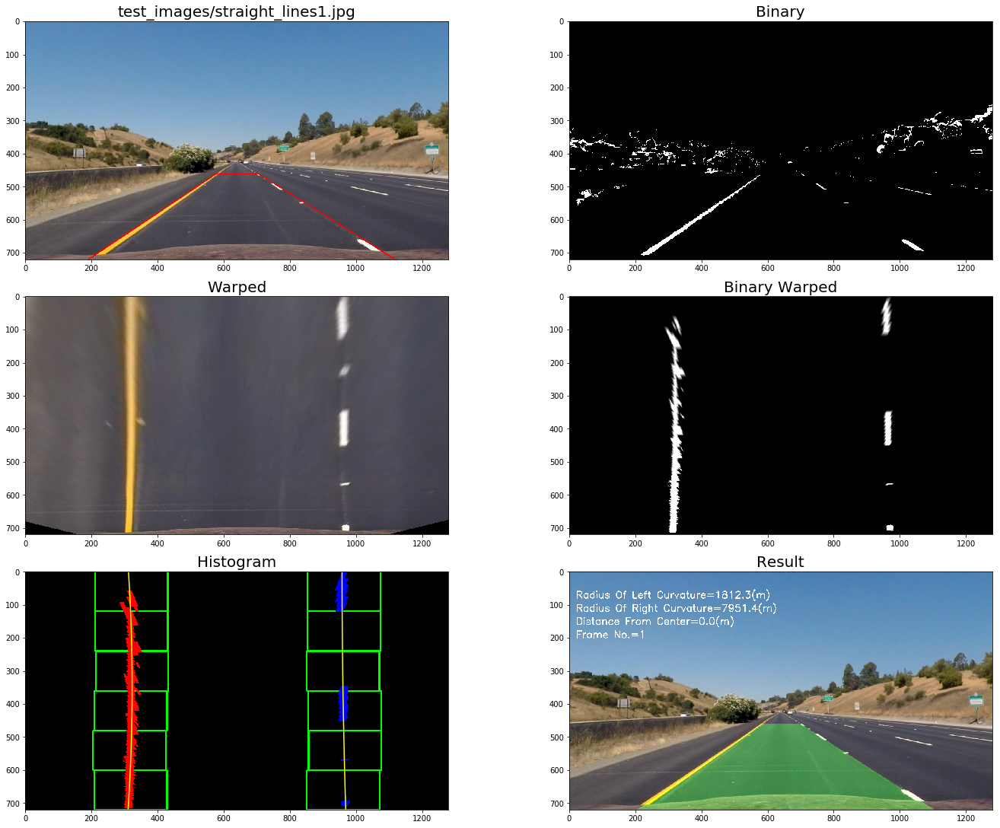

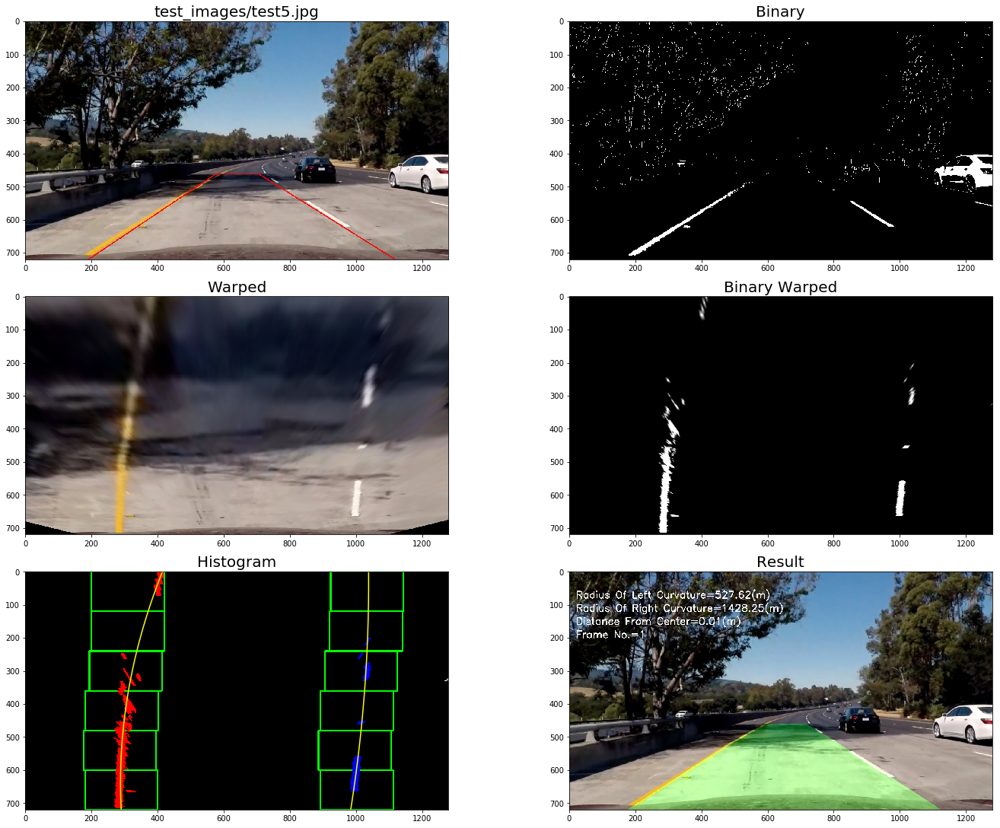

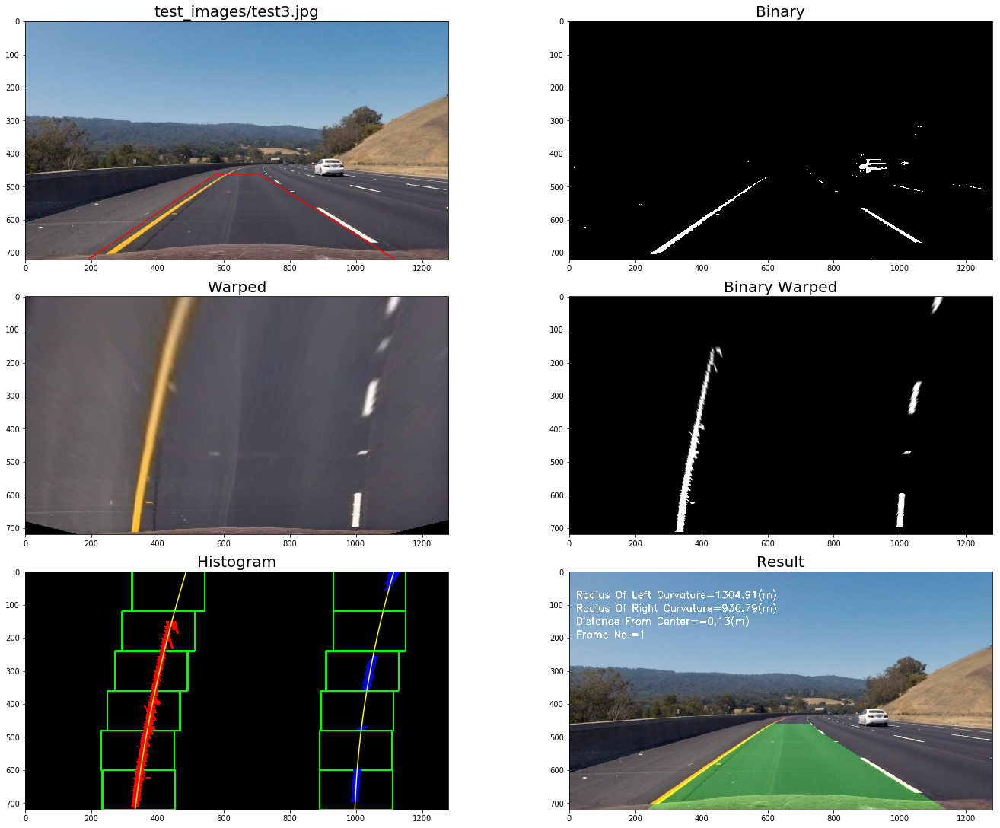

In [11]:
import glob
test_images = glob.glob('test_images/*.jpg')
for idx, fname in enumerate(test_images):
    print("test image:", fname)
    test_pipeline(fname)

In [12]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

class LaneTracker():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  

        # the cached left fit
        self.left_fit = None
        
        # the cached right fit
        self.right_fit = None
        
        # the cached left fit_x
        self.left_fitx = None
        
        # the cached right fit_x
        self.right_fitx = None
        
        # the cached left radius of curvature
        self.left_curverad = None 
        
        # the cached right radius of curvature
        self.right_curverad = None
        
        # the cached vehicle position
        self.vehicle_position = None
        
        # the cached binary warped image
        self.binary_warped = None
        
        # the cached matrix
        self.M = None
        
        # the cached inverse matrix
        self.M_inv = None
        
def check_sanity(left_curverad, right_curverad, left_fit, right_fit, left_fitx, right_fitx, vehicle_position, ym_per_pix = 30/720, xm_per_pix = 3.7/700):
    # Check that they have similar curvature
    if left_curverad==0:
        return False
    
    if right_curverad==0:
        return False
    
    if max(left_curverad, right_curverad) / min(left_curverad, right_curverad) > 10:
        return False
   
    # Check that they are separated by approximately the right distance horizontally
    near_lane_width = abs(left_fitx[0]-right_fitx[0]) * xm_per_pix
    if near_lane_width < 1 or near_lane_width > 10:
        return False
    
    far_lane_width = abs(left_fitx[-1]-right_fitx[-1]) * xm_per_pix
    if far_lane_width < 1 or far_lane_width > 10:
        return False
    
    # Check that they are roughly parallel
    if max(near_lane_width, far_lane_width) / min(near_lane_width, far_lane_width) > 1.5:
        return False
        
    # Check that the vehicle position is roughly correct
    if vehicle_position > 0.5:
        return False
    
    return True        
    

def process_pipeline(image):
    # Image undistortion
    undist = undistort(image, mtx, dist)
        
    # Binary image    
    binary = combined_threshold(undist)
    
    # Warped Binary Image
    binary_warped, M, M_inv = perspective_transform(binary)
    
    # Processing Preparation
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])

    # Can we apply fast version of histogram search?
    is_good = False
    if tracker.detected == True:
        leftx, lefty, rightx, righty, left_fit, right_fit, out_img = histogram_search_fast(binary_warped, tracker.left_fit, tracker.right_fit)    
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        left_curverad, right_curverad, vehicle_position =  cal_curvature_measure(lefty, leftx, righty, rightx, ploty)
        is_good = check_sanity(left_curverad, right_curverad,  left_fit, right_fit, left_fitx, right_fitx, vehicle_position)
    
    # Can we apply normal histogram search by using the bottom half of the image 
    if is_good == False:
        leftx, lefty, rightx, righty, left_fit, right_fit, out_img = histogram_search(binary_warped, overall=False)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        left_curverad, right_curverad, vehicle_position =  cal_curvature_measure(lefty, leftx, righty, rightx, ploty)
        is_good = check_sanity(left_curverad, right_curverad,  left_fit, right_fit, left_fitx, right_fitx, vehicle_position)
        
    # Can we apply normal histogram search by using all of the image
    if is_good == False:
        leftx, lefty, rightx, righty, left_fit, right_fit, out_img = histogram_search(binary_warped, overall=True)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        left_curverad, right_curverad, vehicle_position =  cal_curvature_measure(lefty, leftx, righty, rightx, ploty)
        is_good = check_sanity(left_curverad, right_curverad,  left_fit, right_fit, left_fitx, right_fitx, vehicle_position)
        
    # Apply the result of detection to the original image
    if is_good == True:  # Detect succesfuly, cache the tracking result  
        tracker.detected = True
        tracker.left_fit = left_fit
        tracker.right_fit = right_fit
        tracker.left_fitx = left_fitx
        tracker.right_fitx = right_fitx
        tracker.left_curverad = left_curverad 
        tracker.right_curverad = right_curverad
        tracker.vehicle_position = vehicle_position
        tracker.binary_warped = binary_warped
        tracker.M = M
        tracker.M_inv = M_inv
        
        result = apply_inverse(
            binary_warped, 
            undist, 
            M_inv, 
            left_fitx, 
            right_fitx, 
            ploty, 
            left_curverad, 
            right_curverad, 
            vehicle_position,
            process_pipeline.frame
        )
    else:  # Detect not successfully, using the cached result
        tracker.detected = False
        result = apply_inverse(
            tracker.binary_warped, 
            undist, 
            tracker.M_inv, 
            tracker.left_fitx, 
            tracker.right_fitx, 
            ploty, 
            tracker.left_curverad, 
            tracker.right_curverad, 
            tracker.vehicle_position,
            process_pipeline.frame
        )
        
        left_fitx = tracker.left_fitx
        right_fix = tracker.right_fitx
    
    # Debug video genearation
    if process_pipeline.debug == True:
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))
        cv2.polylines(out_img, np.int_([pts]), False, (255,255,0), thickness=2, lineType=cv2.CV_AA)

        binary_result = np.concatenate((binary, binary_warped), axis=1)
        binary_result = np.dstack((binary_result, binary_result, binary_result))
        search_result = np.concatenate((result, out_img), axis=1)
        result = np.concatenate((search_result, binary_result), axis=0)
    
    process_pipeline.frame = process_pipeline.frame + 1

    return result

In [13]:
# Using P1 video processing method
process_pipeline.frame = 0
process_pipeline.debug = True
tracker = LaneTracker()

output = 'output_videos/project_detection_debug_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(process_pipeline)
%time output_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_videos/project_detection_debug_video.mp4
[MoviePy] Writing video output_videos/project_detection_debug_video.mp4


100%|█████████▉| 1260/1261 [02:55<00:00,  6.91it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_detection_debug_video.mp4 

CPU times: user 9min 45s, sys: 5.99 s, total: 9min 51s
Wall time: 2min 56s


In [14]:
process_pipeline.frame = 0
process_pipeline.debug = False
tracker = LaneTracker()

output = 'output_videos/project_detection_video.mp4'
clip2 = VideoFileClip("project_video.mp4")
output_clip = clip2.fl_image(process_pipeline)
%time output_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_videos/project_detection_video.mp4
[MoviePy] Writing video output_videos/project_detection_video.mp4


100%|█████████▉| 1260/1261 [02:34<00:00,  7.92it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_detection_video.mp4 

CPU times: user 9min 30s, sys: 3.74 s, total: 9min 34s
Wall time: 2min 35s
